<a href="https://colab.research.google.com/github/ranadeepbhuyan/ml-class/blob/master/DICOM_image_3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install nilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 50.2 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow_io

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 40.0 MB/s eta 0:00:00


In [ ]:
!pip install pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install dicom2jpg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 57.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['animation.html'] = 'jshtml'
import matplotlib.animation as animation

In [ ]:
data_path = "/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM"

In [ ]:
train_data_path = '/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM/UPENN-GBM-00366/03-08-2010-NA-HEADBRAIN TUMOR-15629/16.000000-MDDW DTI AXIAL 30 DIRECTION-76250/'
validation_path = '/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM/UPENN-GBM-00366/03-08-2010-NA-HEADBRAIN TUMOR-15629/24.000000-PERFUSION BOLUS-70683/'

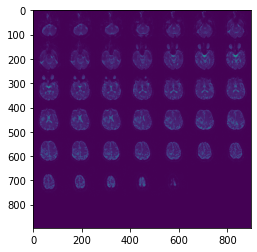

In [ ]:
#test_image=nib.load(train_data_path + '01-01.dcm')

import pydicom as dicom
import matplotlib.pylab as plt


ds = dicom.dcmread(train_data_path + '01-01.dcm')

plt.imshow(ds.pixel_array)

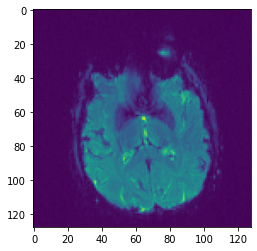

In [ ]:
dsv = dicom.dcmread(validation_path + '01-001.dcm')

plt.imshow(dsv.pixel_array)

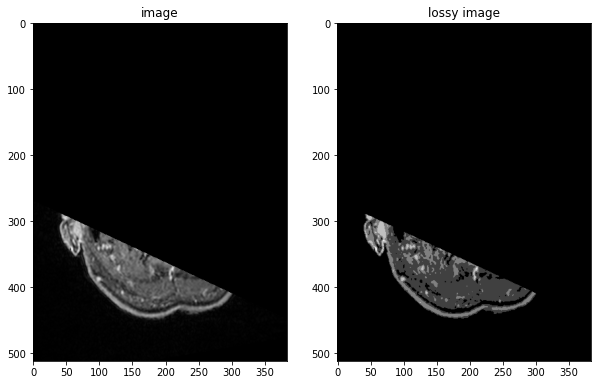

In [ ]:
import tensorflow_io as tfio

image_bytes = tf.io.read_file('/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM/UPENN-GBM-00366/03-08-2010-NA-HEADBRAIN TUMOR-35104/25.000000-AX T1 3D POST STEALTH  ProcessedCaPTk-03818/1-018.dcm')
image = tfio.image.decode_dicom_image(image_bytes, dtype=tf.uint16)

skipped = tfio.image.decode_dicom_image(image_bytes, on_error='skip', dtype=tf.uint8)

lossy_image = tfio.image.decode_dicom_image(image_bytes, scale='auto', on_error='lossy', dtype=tf.uint8)


fig, axes = plt.subplots(1,2, figsize=(10,10))
axes[0].imshow(np.squeeze(image.numpy()), cmap='gray')
axes[0].set_title('image')
axes[1].imshow(np.squeeze(lossy_image.numpy()), cmap='gray')
axes[1].set_title('lossy image');

In [ ]:
image.shape

TensorShape([1, 128, 128, 1])

In [ ]:
image.shape


TensorShape([1, 896, 896, 1])

In [ ]:
image.shape

TensorShape([1, 512, 384, 1])

In [ ]:
import os
data_path1 = '/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM/UPENN-GBM-00366/03-08-2010-NA-HEADBRAIN TUMOR-35104/25.000000-AX T1 3D POST STEALTH  ProcessedCaPTk-03818/'
index = []
number = []
for i in range(1,192):
  number = f"{i:03d}"
  index = dicom.dcmread(data_path1 + '1-'+str(number)+'.dcm')
  #final_image.save("my_awesome.gif", format="GIF", append_images=final_image,
               #save_all=True, duration=100, loop=0)


In [ ]:
#convert dicom to jpg image
import os
data_path1 = '/content/gdrive/MyDrive/UPENN-GBM/manifest-1632427972040/UPENN-GBM/UPENN-GBM-00366/03-08-2010-NA-HEADBRAIN TUMOR-35104/25.000000-AX T1 3D POST STEALTH  ProcessedCaPTk-03818/'
image1 = []
number = []
for i in range(1,192):
  number = f"{i:03d}"
  img = dicom2jpg.dicom2img(data_path1 + '1-'+str(number)+'.dcm')
  image1.append(img)
  #final_image.save("my_awesome.gif", format="GIF", append_images=final_image,
               #save_all=True, duration=100, loop=0)


In [ ]:
image1[0].shape

(512, 384)

In [ ]:
def show_animation(images: list):
    '''
    Displays an animation from the list of images.

    set: matplotlib.rcParams['animation.html'] = 'jshtml'

    '''
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(images[0], cmap='gray')

    def animate_func(i):
        im.set_array(images[i])
        return [im]

    return matplotlib.animation.FuncAnimation(fig, animate_func, frames = len(images), interval = 20)

No of images: 191


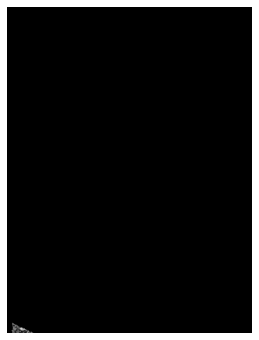

In [ ]:
print('No of images:', len(image1))

flair_animation = show_animation(image1)
flair_animation